In [113]:
import numpy as np
import cv2
import matplotlib.pyplot as plt


In [114]:
def display(img):
    plt.figure(figsize=(25,20))
    plt.imshow(img)

In [115]:
id_blured = cv2.imread('id_clear.jpeg')

In [73]:
img_blur = cv2.medianBlur(id_blured, 27)

In [74]:
img_gray = cv2.cvtColor(img_blur, cv2.COLOR_BGR2GRAY)

In [75]:
countours, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

In [76]:
for i in range(len(hierarchy)):
    if hierarchy[0][i][3] == -1:
        cv2.drawContours(id_blured, countours, i, (255, 0,0), 10)
    

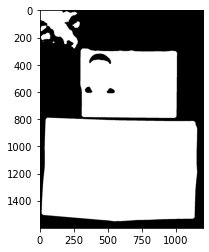

In [78]:
_, thresh = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
plt.imshow(thresh, cmap='gray')

In [79]:
kernel = np.ones((3,3), np.uint8)

In [80]:
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

In [81]:
sure_bg = cv2.dilate(opening, kernel,  iterations=1)

In [82]:
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 3)

In [83]:
_, sure_fg = cv2.threshold(dist_transform, 0.1*dist_transform.max(), 255, 0)

In [84]:
sure_fg=np.uint8(sure_fg)
sure_bg=np.uint8(sure_bg)

In [85]:
unknown_rigeon = cv2.subtract(sure_fg, sure_bg)

In [86]:
ret, markers = cv2.connectedComponents(sure_bg)

In [87]:
markers = markers+1

In [88]:
markers[unknown_rigeon==255] = 0

In [89]:
markers = cv2.watershed(id_blured, markers)

In [90]:
countours, hierarchy = cv2.findContours(markers.copy(), cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

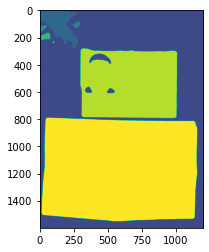

In [91]:
plt.imshow(markers)

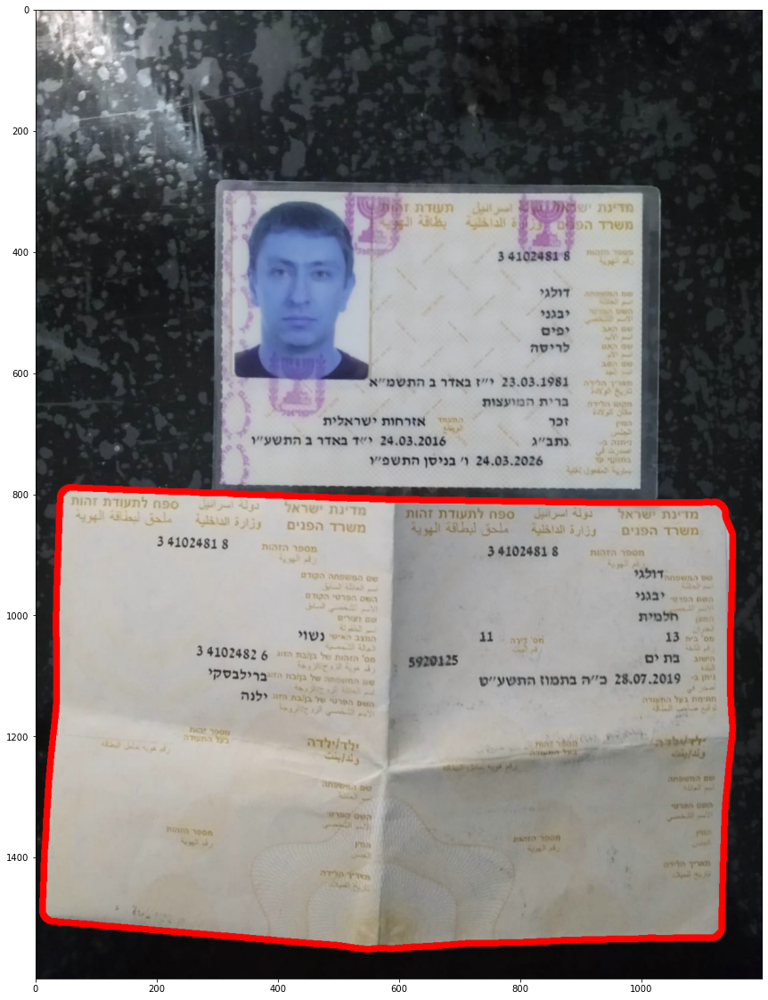

In [92]:
id_blured = cv2.imread('id_clear.jpeg')
for i in range(len(hierarchy)):
    if hierarchy[0][i][3] == -1:
        cv2.drawContours(id_blured, countours, i, (255, 0,0), 10)

            
plt.figure(figsize=(25,20))
plt.imshow(id_blured)            

(11, 789, 1140, 763)
(294, 281, 710, 512)
(1, 1, 1198, 1598)
(10, 788, 1142, 765)
(293, 280, 712, 514)


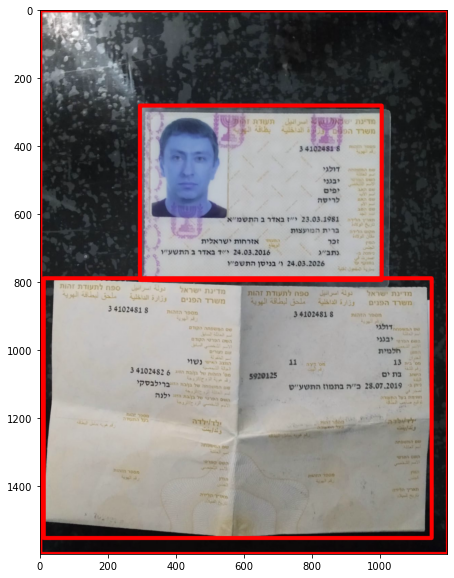

In [99]:
id_blured = cv2.imread('id_clear.jpeg')
coords = []
for c in countours:
    if cv2.contourArea(c) >= 100000 :
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(id_blured, (x, y), (x + w, y + h), (255, 0,0), 10)
        center = (x,y, w, h)
        coords.append(center)
        print (center)
plt.figure(figsize=(12,10))
plt.imshow(id_blured)

In [646]:
resized = cv2.resize(id_blured, (400, 300), cv2.INTER_LINEAR)

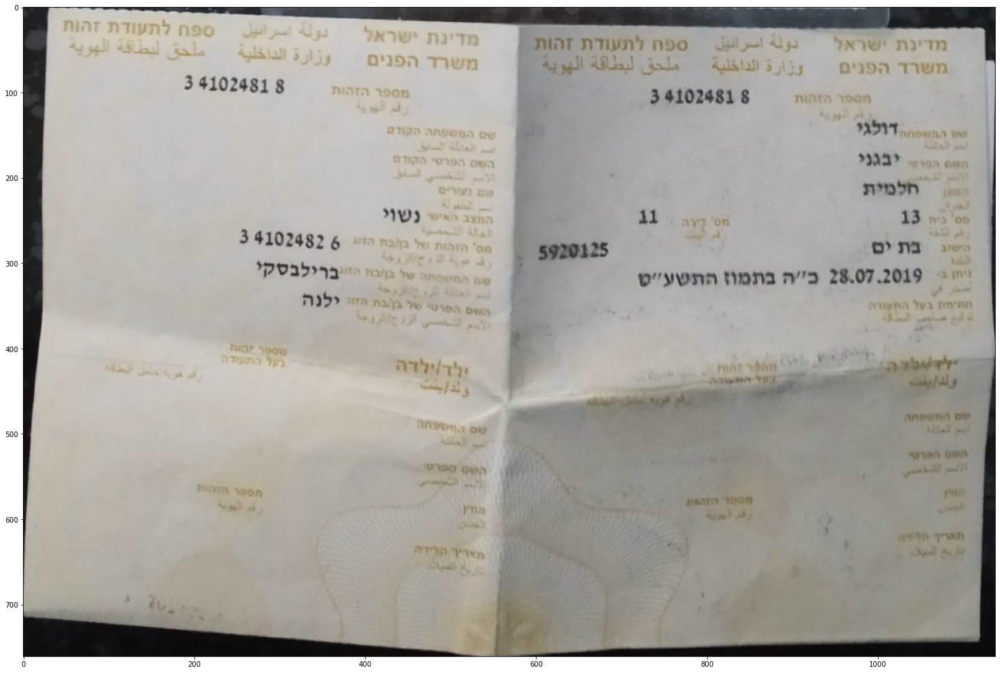

In [6]:
id1 = id_blured[790 : 790+761, 12: 12+1138]
display(id1)

In [7]:
id2 = id_blured[282 : 282+510, 295: 295+709]

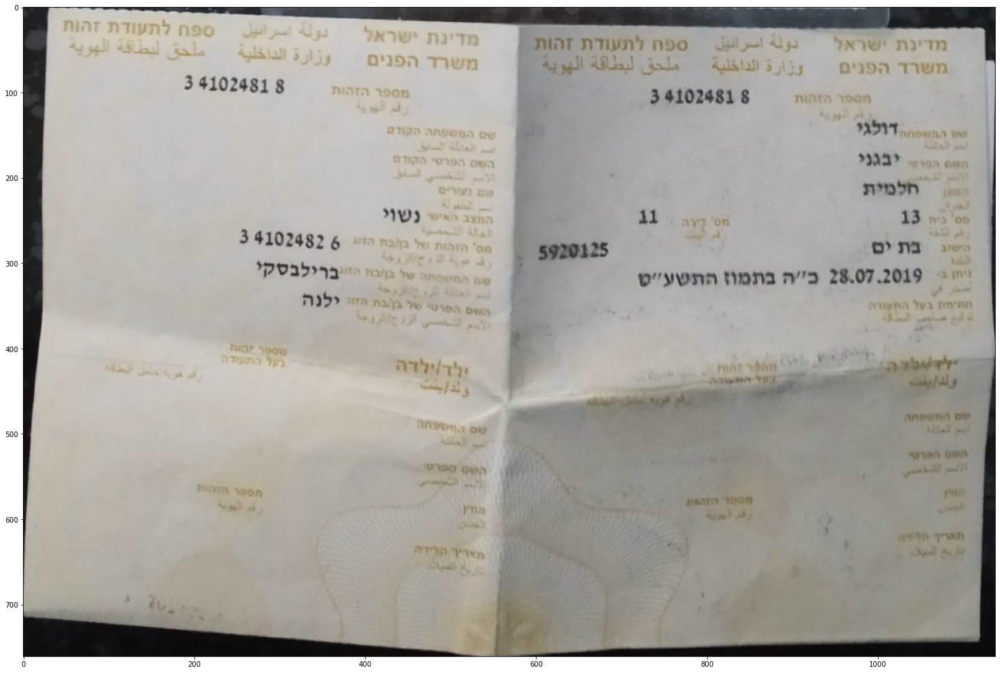

In [21]:
display(id1)

In [664]:
!pip install tesseract-ocr

  ERROR: Command errored out with exit status 1:
   command: 'C:\Users\edo4s\anaconda3\python.exe' -u -c 'import io, os, sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\edo4s\\AppData\\Local\\Temp\\pip-install-x1on9m46\\tesseract-ocr_71ac888278d148be86cf69ce2598bec2\\setup.py'"'"'; __file__='"'"'C:\\Users\\edo4s\\AppData\\Local\\Temp\\pip-install-x1on9m46\\tesseract-ocr_71ac888278d148be86cf69ce2598bec2\\setup.py'"'"';f = getattr(tokenize, '"'"'open'"'"', open)(__file__) if os.path.exists(__file__) else io.StringIO('"'"'from setuptools import setup; setup()'"'"');code = f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d 'C:\Users\edo4s\AppData\Local\Temp\pip-wheel-rj6kaskn'
       cwd: C:\Users\edo4s\AppData\Local\Temp\pip-install-x1on9m46\tesseract-ocr_71ac888278d148be86cf69ce2598bec2\
  Complete output (10 lines):
  C:\Users\edo4s\anaconda3\lib\site-packages\setuptools\dist.py:717: UserWarning: Usage of dash-


  Using cached tesseract-ocr-0.0.1.tar.gz (33 kB)
  Running setup.py clean for tesseract-ocr
Failed to build tesseract-ocr
    Running setup.py install for tesseract-ocr: started
    Running setup.py install for tesseract-ocr: finished with status 'error'


In [103]:
def plot_coords(img, crds):
    y = crds[1]
    h = crds[3]
    x = crds[0]
    w = crds[2]
    img = img[y: y+h, x: x+w]
    return img
    

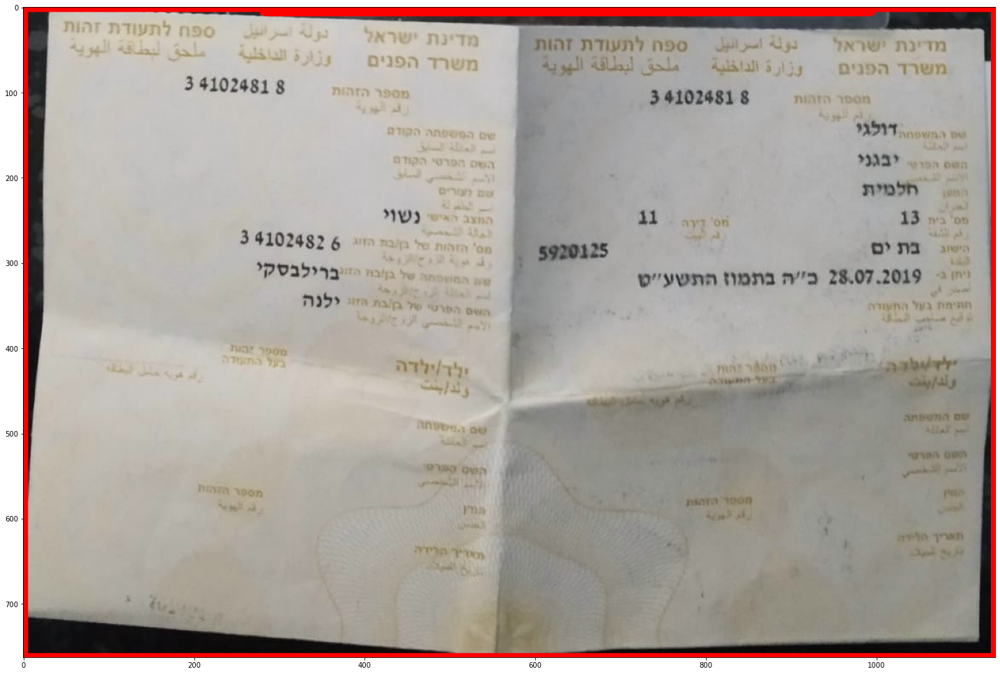

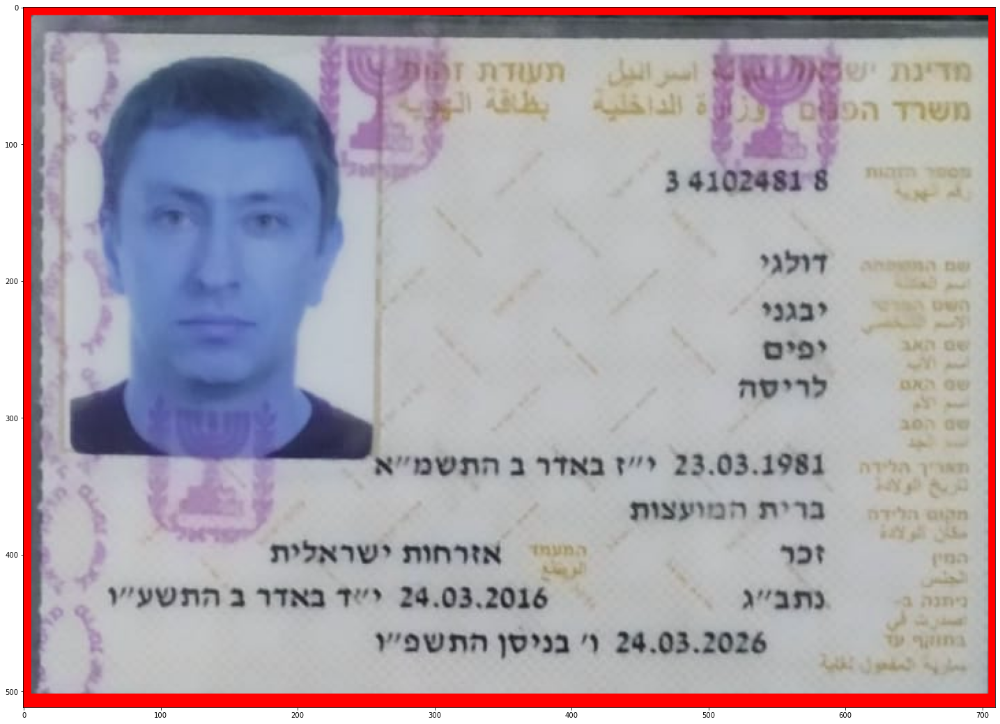

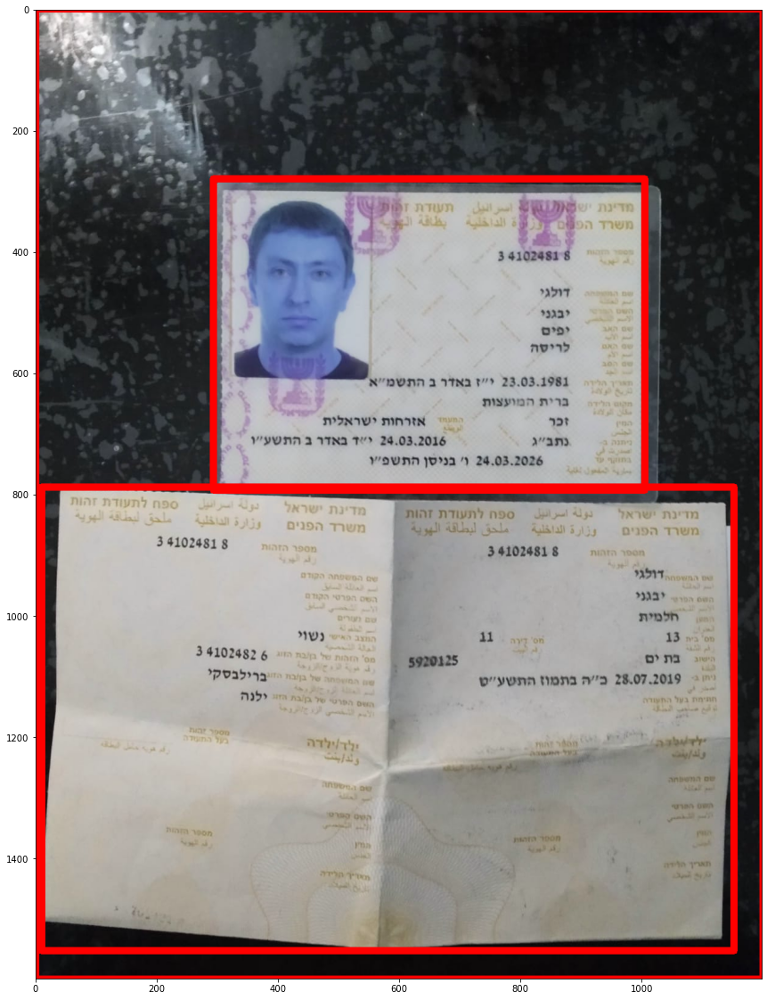

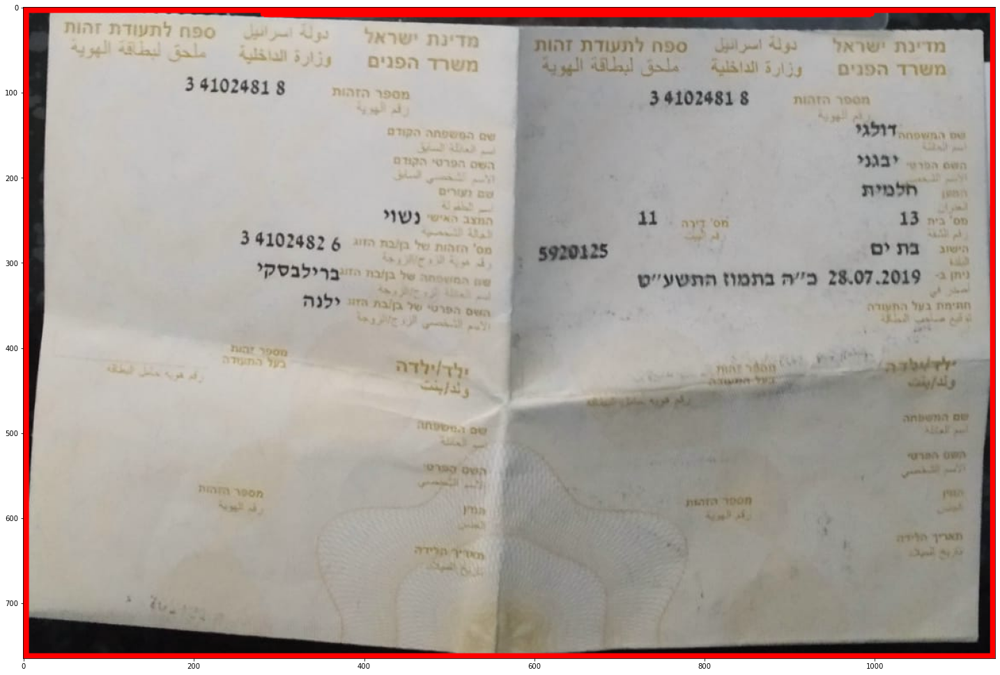

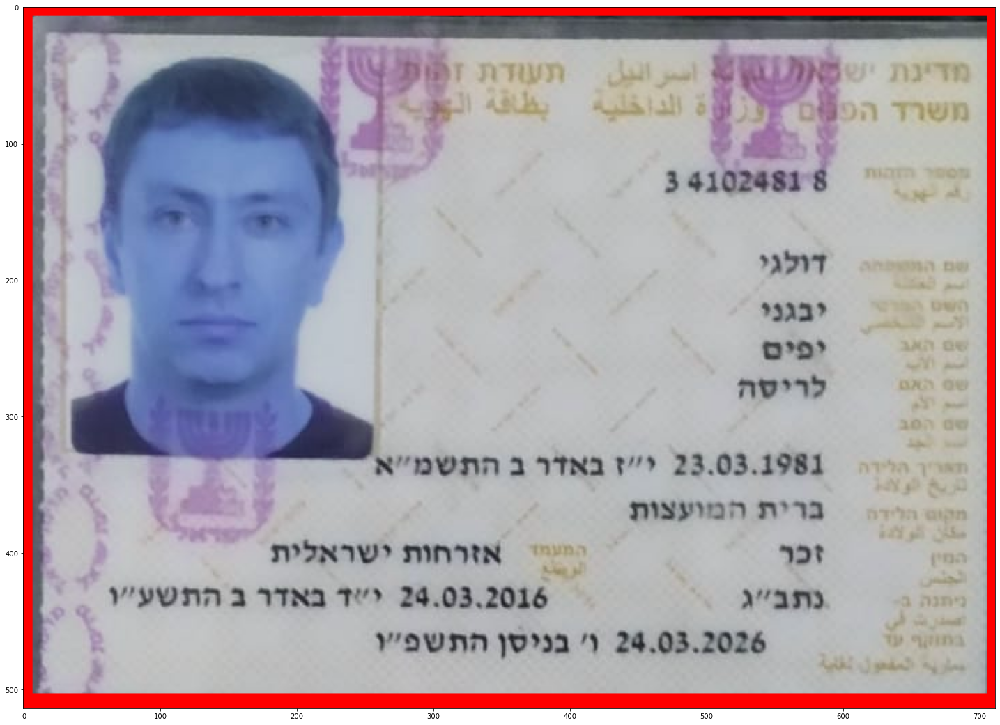

In [108]:
for i in range(len(coords)):
#     plt.subplot(1, len(coords), i+1)
    display(plot_coords(id_blured, coords[i]))

In [1]:
import pytesseract

In [66]:
# pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files (x86)\Tesseract-OCR\tesseract.exe'
kernel = np.ones((3,3), np.uint8)
gray = cv2.cvtColor(id1, cv2.COLOR_BGR2GRAY)
blured = cv2.GaussianBlur(dilayed, (3,3),0)
_, thresh = cv2.threshold(blured, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
eroded = cv2.erode(thresh, kernel, iterations=1)
dilayed = cv2.dilate(eroded, kernel, iterations=1)

# blured = cv2.GaussianBlur(dilayed, (3,3),0)
s = pytesseract.image_to_string(dilayed, lang='eng', config='--psm 6')

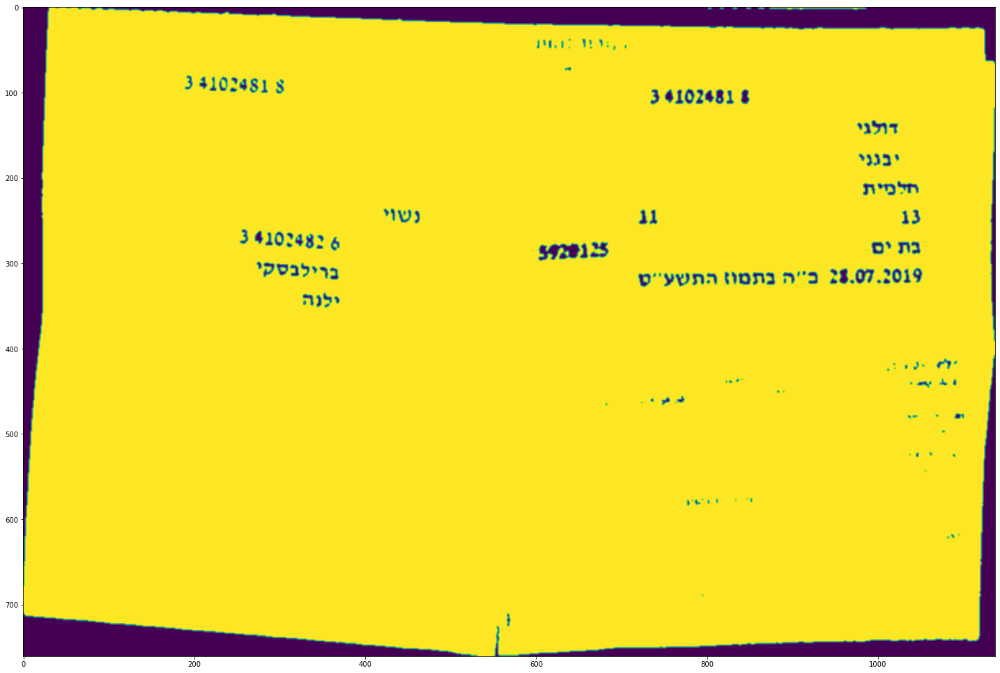

In [67]:
display(blured)

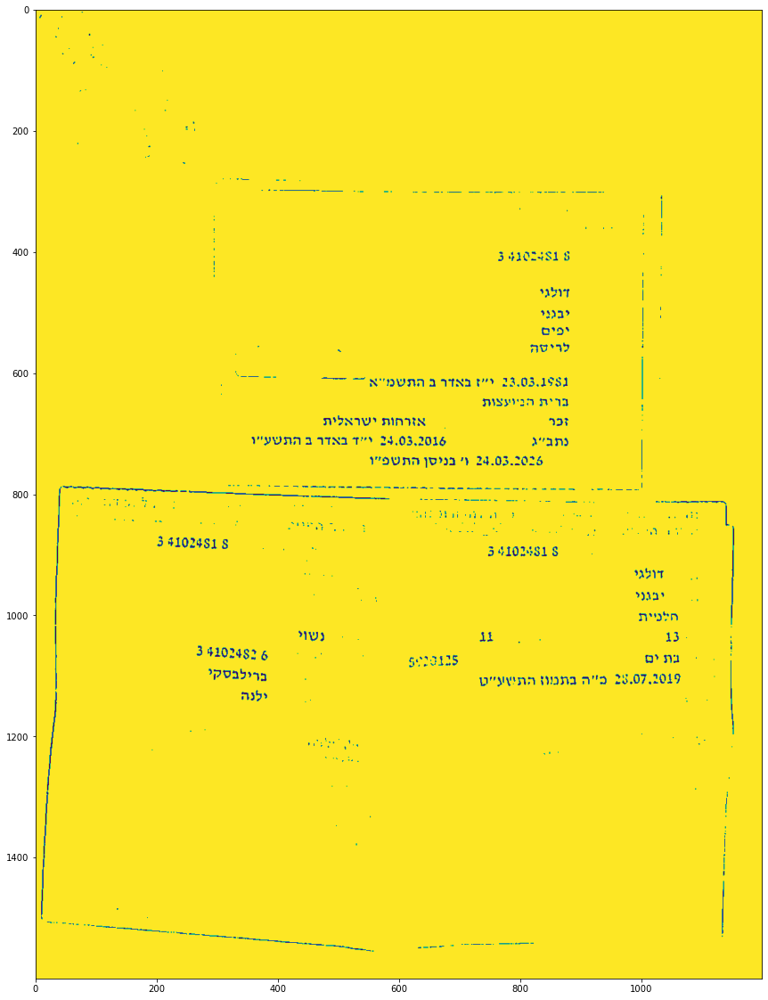

In [162]:
gray = cv2.cvtColor(id_blured, cv2.COLOR_BGR2GRAY)
blured = cv2.GaussianBlur(gray, (3,3), 5)
# _, thresh = cv2.threshold(blured, 110, 255, cv2.THRESH_TOZERO)
thresh = cv2.adaptiveThreshold(blured, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 5, 13)
eroded = cv2.erode(thresh, kernel, iterations=1)
delaid = cv2.dilate(eroded, kernel, iterations=1)

display(thresh)

# Gamma Correction (brightness)

In [168]:
id_blured = cv2.imread('id_clear.jpeg', 0)

In [178]:
gamma = 1/2

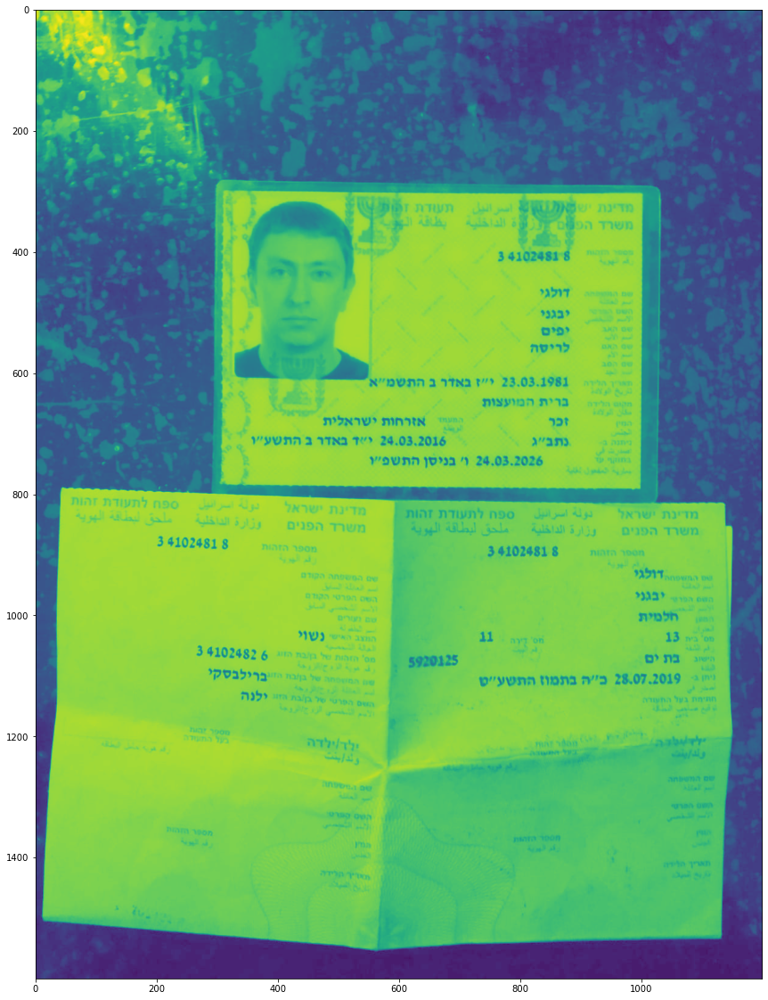

In [179]:
display(np.power(id_blured, gamma))


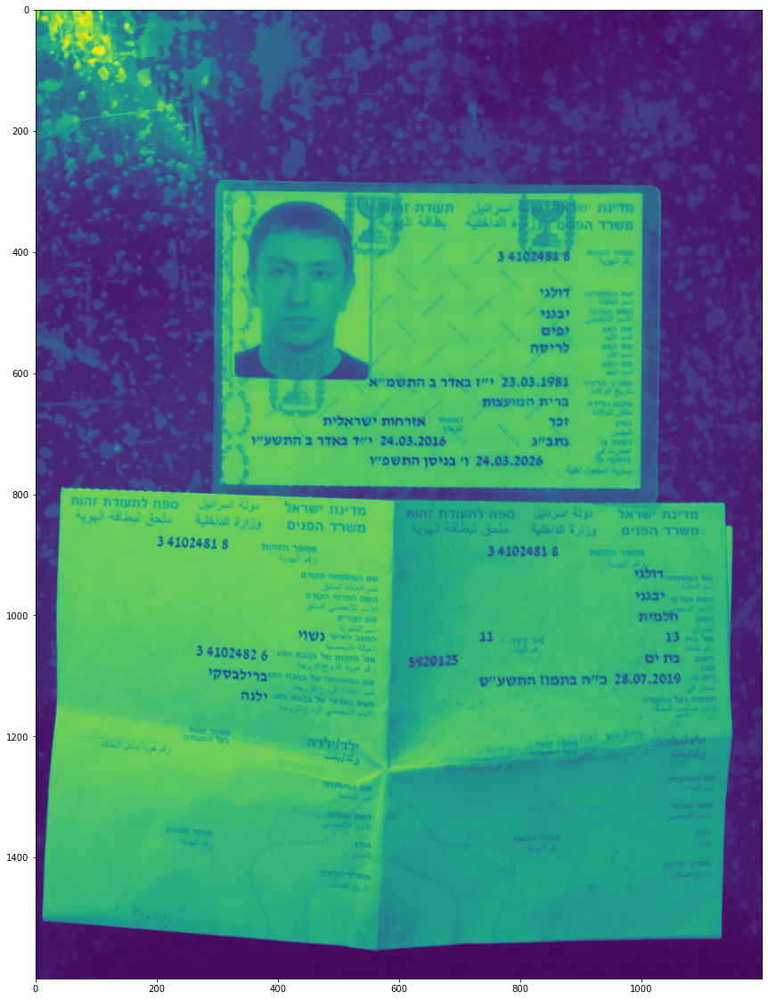

In [173]:
display(id_blured)

# smothing & bluring

In [180]:
kernel = np.ones((5,5), dtype='float32')/25

In [181]:
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

In [184]:
destination = cv2.filter2D(id_blured, -1, kernel)

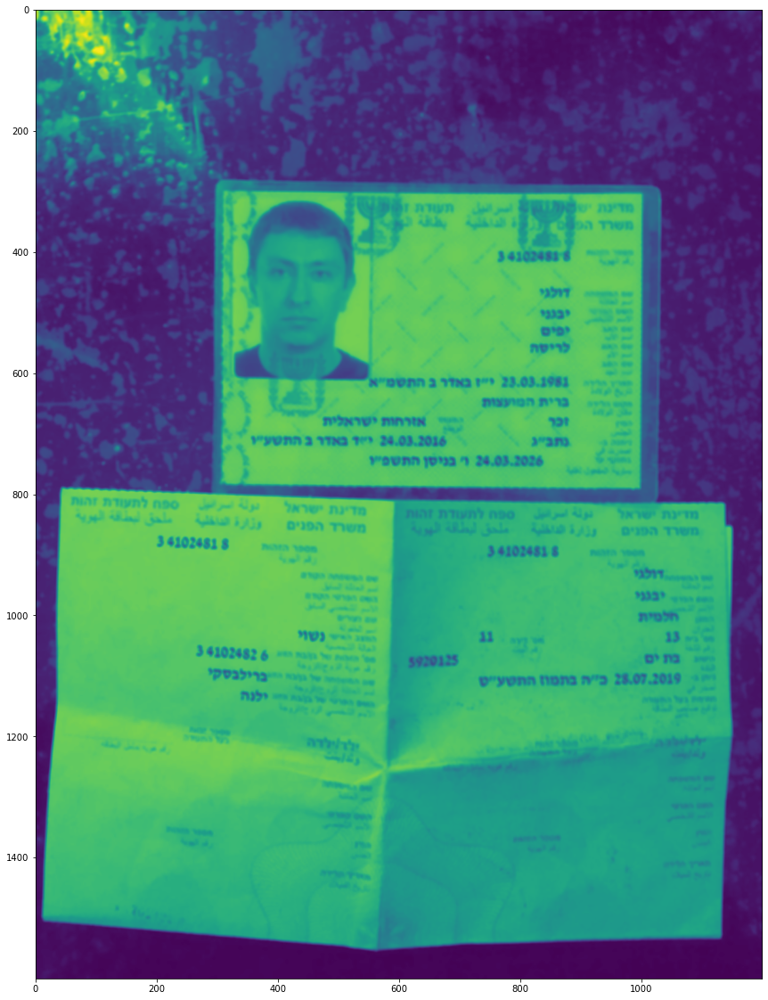

In [185]:
display(destination)

In [193]:
media_blur = cv2.medianBlur(id_blured, 5) #5 stand for kenel size (5,5)

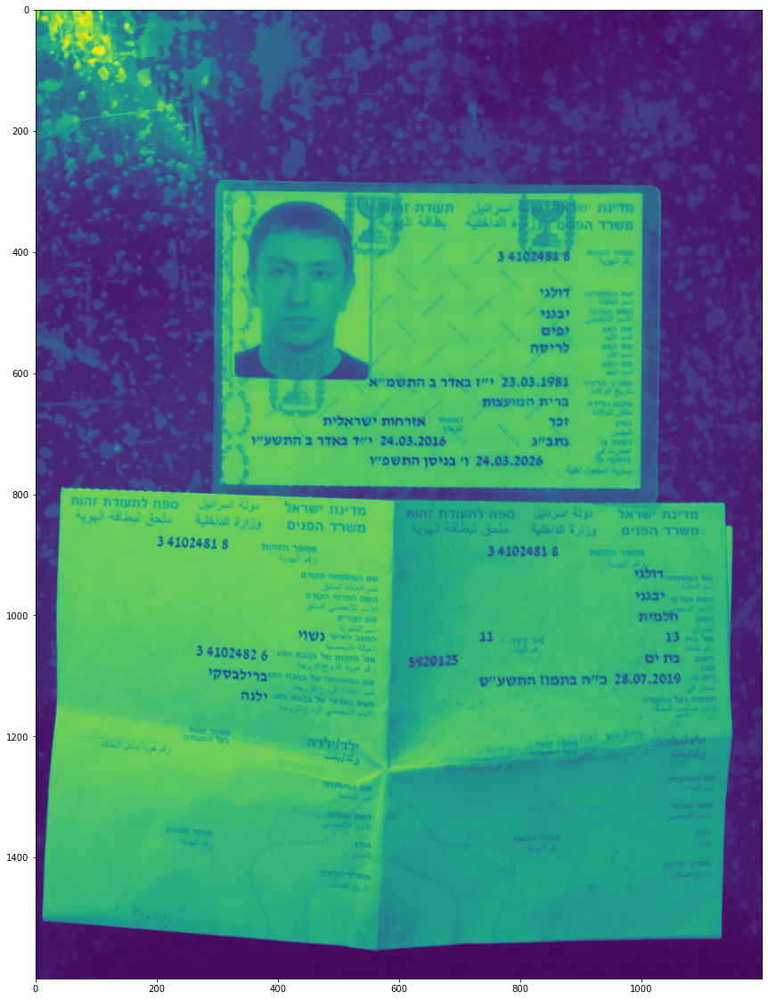

In [194]:
display(id_blured)

In [196]:
filtered = cv2.bilateralFilter(id_blured, 9, 75, 75) #blur image with kiping edges sharp

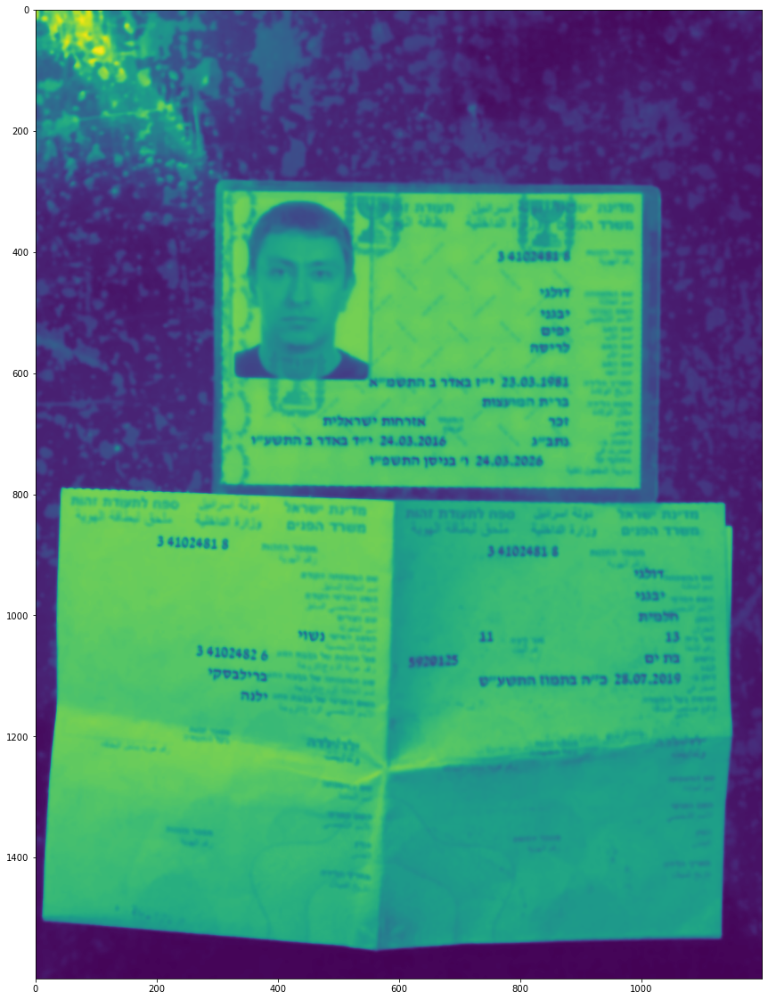

In [197]:
display(filtered)

# Morphological operations

In [227]:
kernel = np.ones((3,3), np.uint8)

In [203]:
kernel

array([[1, 1, 1],
       [1, 1, 1],
       [1, 1, 1]], dtype=uint8)

In [210]:
result = cv2.erode(id_blured, kernel, iterations=1)

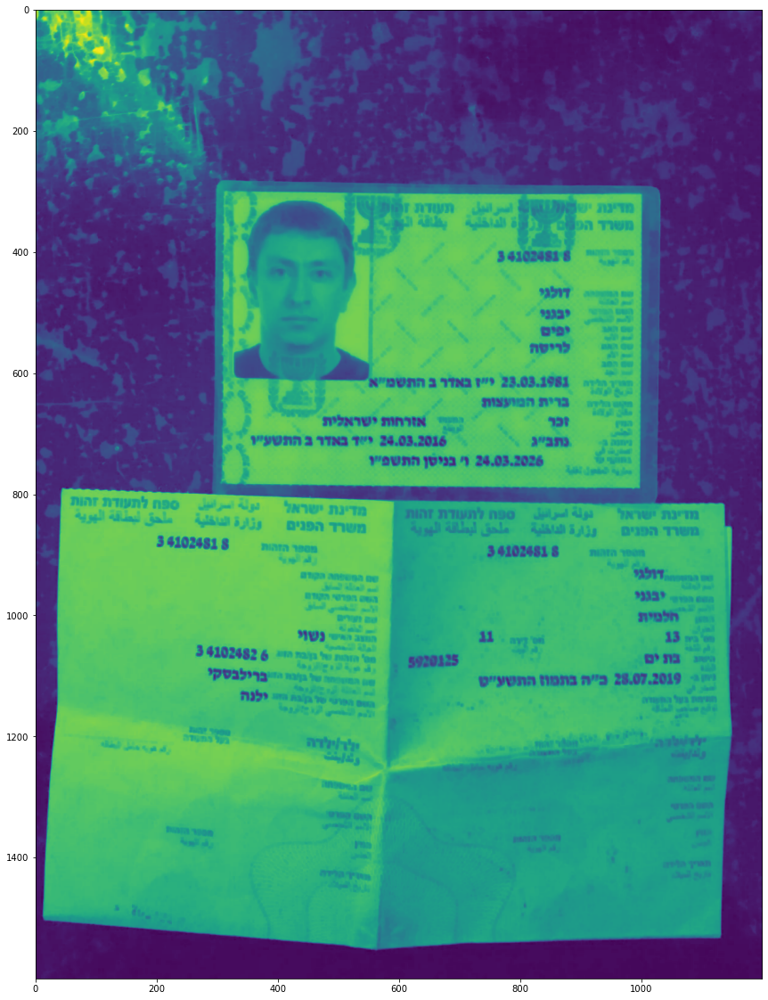

In [211]:
display(result)

# opening goes after dilation. opening removes background noise

In [212]:
dilated = cv2.dilate(id_blured, kernel, iterations=1)

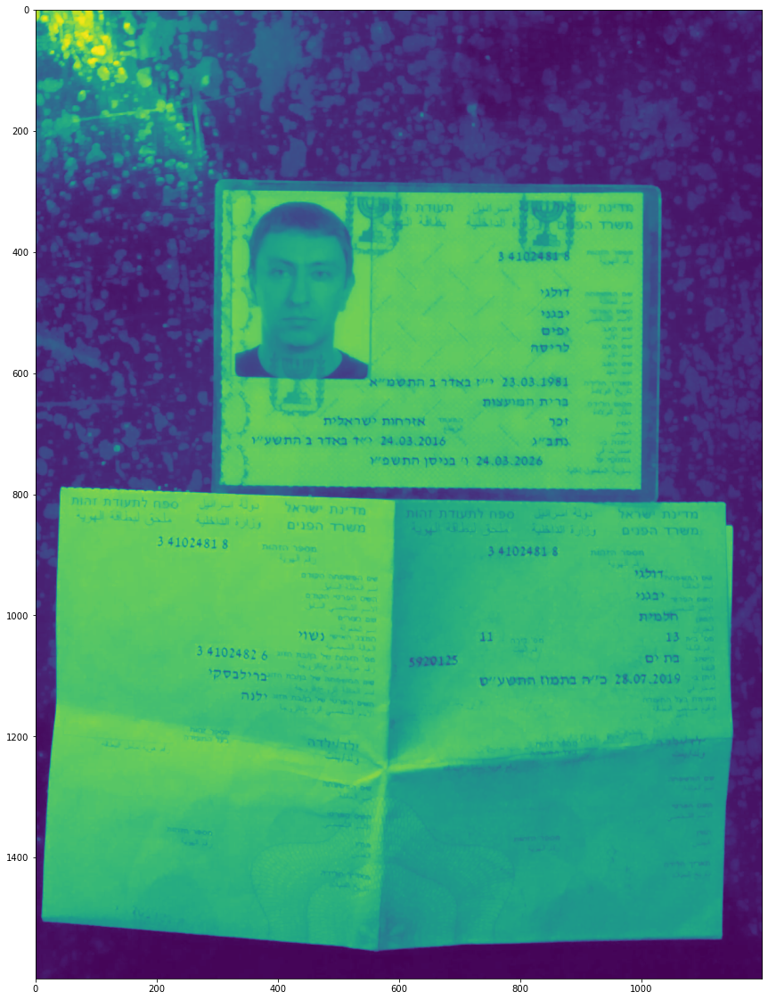

In [213]:
display(dilated)

In [220]:
opened = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)

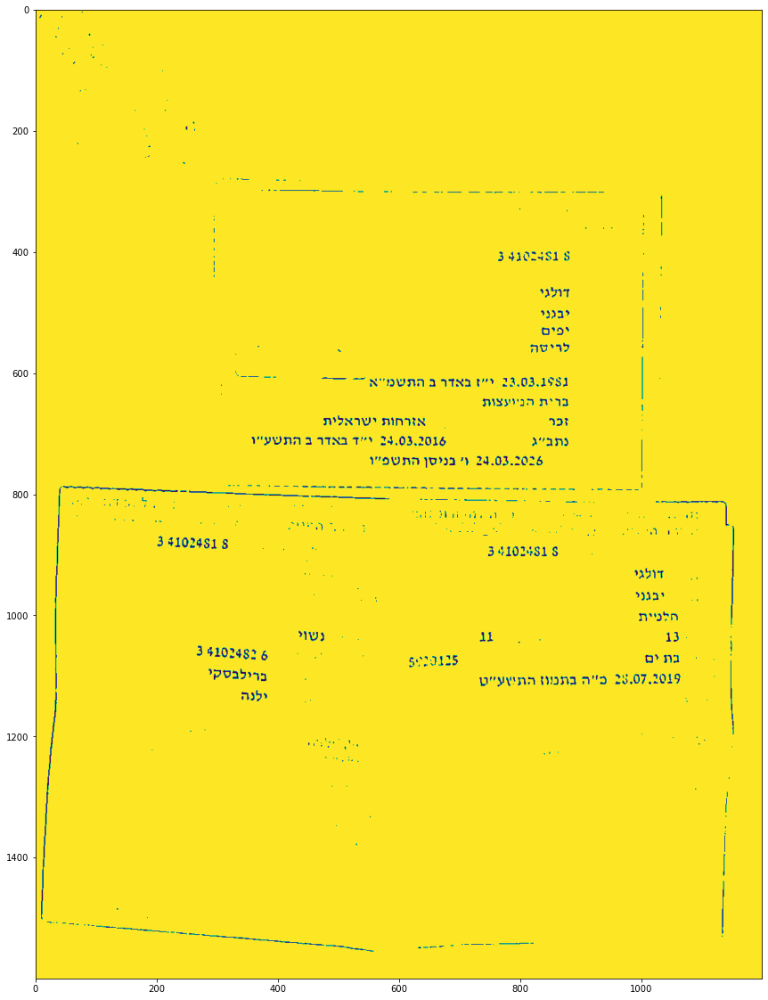

In [221]:
display(opened)

# Closing removes fortground noise¶

In [228]:
closed = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)

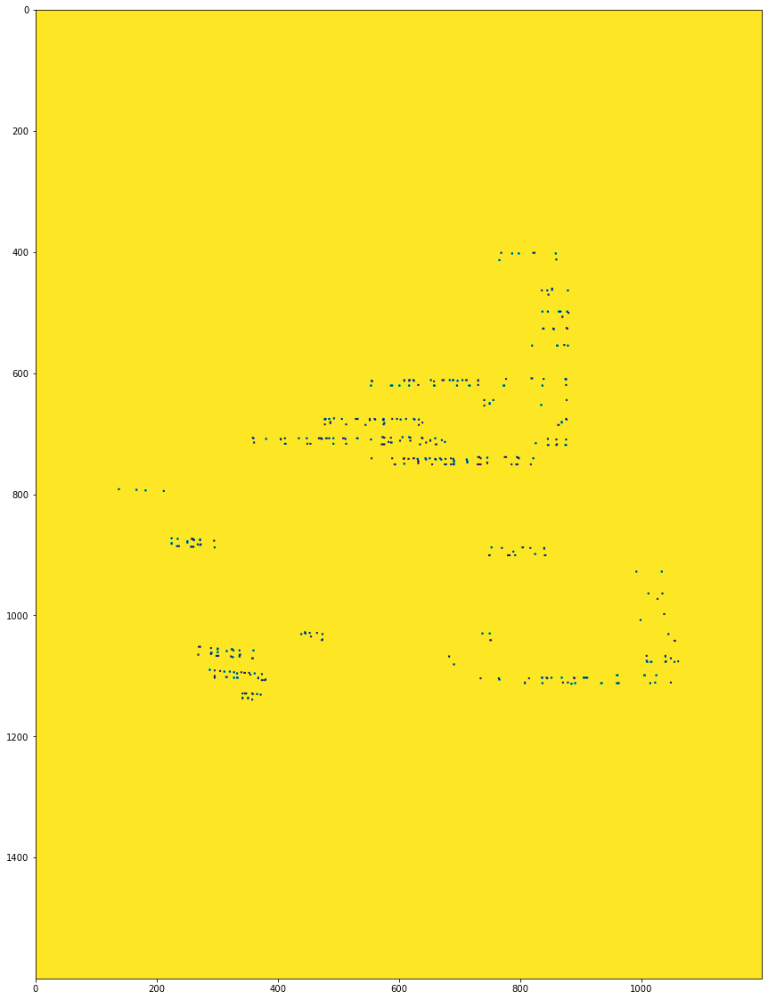

In [229]:
display(closed)

# morphological greadient takes differnce betwen erosion and dilation

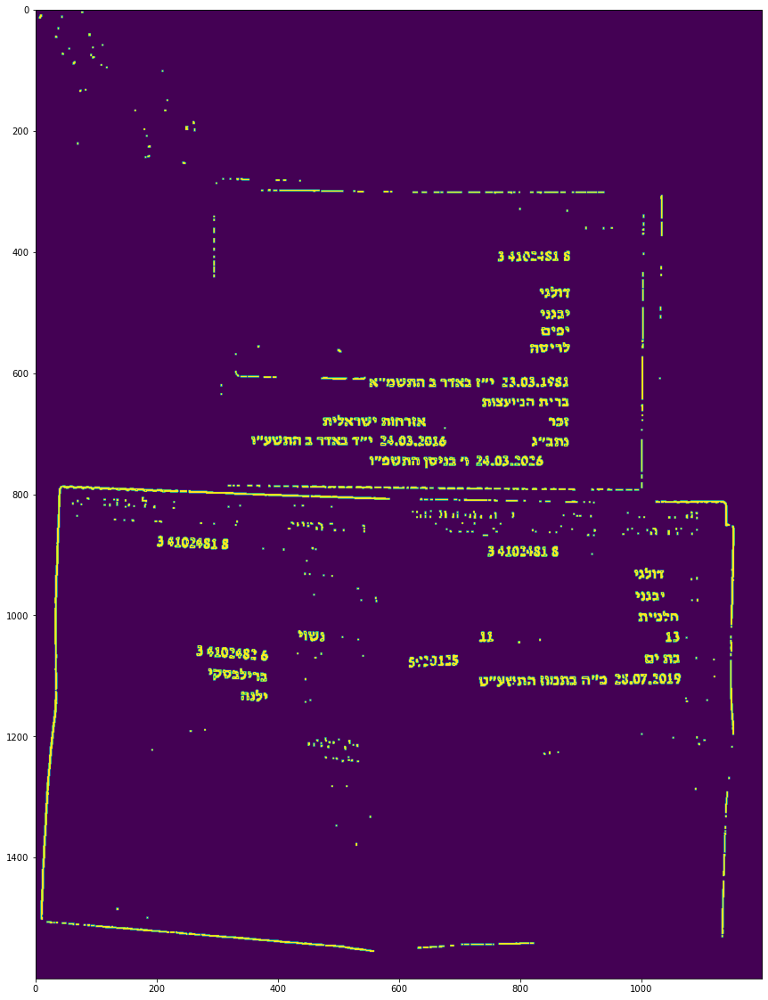

In [231]:

gradient = cv2.morphologyEx(thresh, cv2.MORPH_GRADIENT, kernel)
display(gradient)

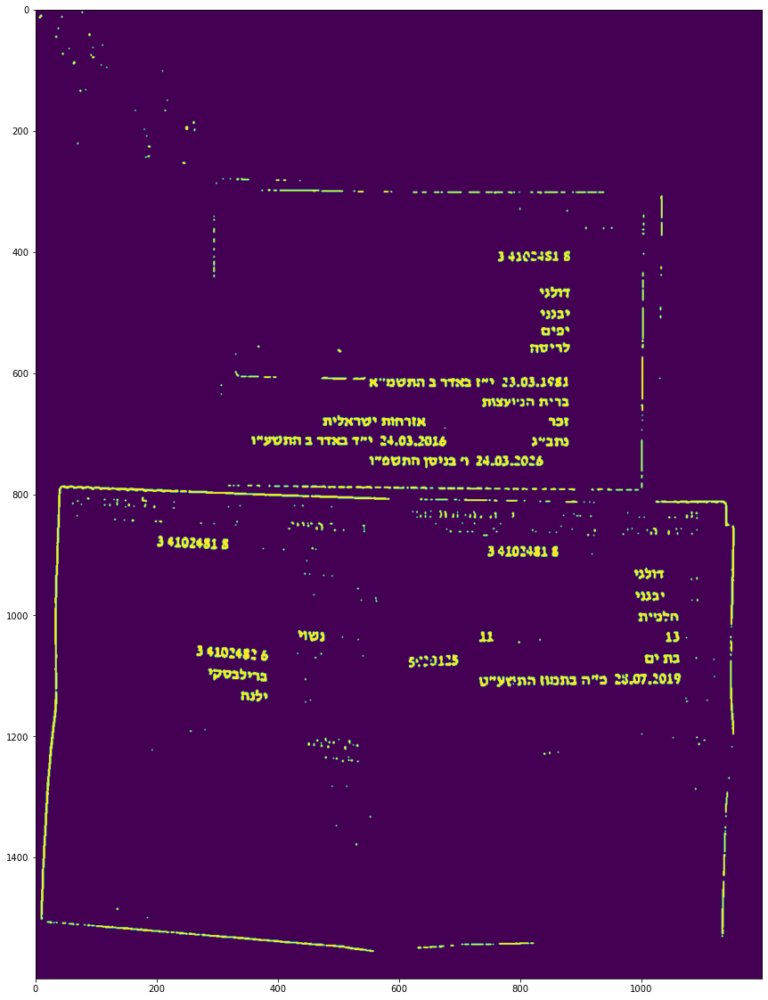

In [234]:
display(cv2.medianBlur(gradient, 3))

In [245]:
sobely = cv2.Sobel(id_blured, cv2.CV_64F, 1, 0, ksize=5)
sobelx = cv2.Sobel(id_blured, cv2.CV_64F, 0, 1, ksize=5)

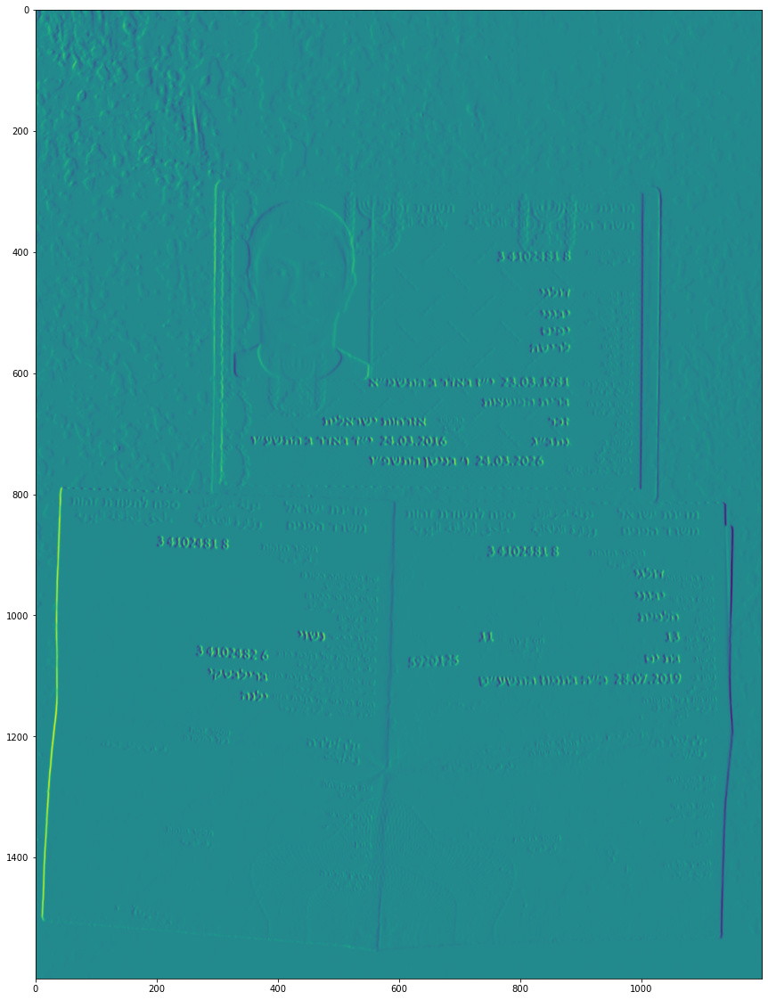

In [246]:
display(sobely)

# Laplacian

In [239]:
laplacian = cv2.Laplacian(thresh, cv2.CV_64F)

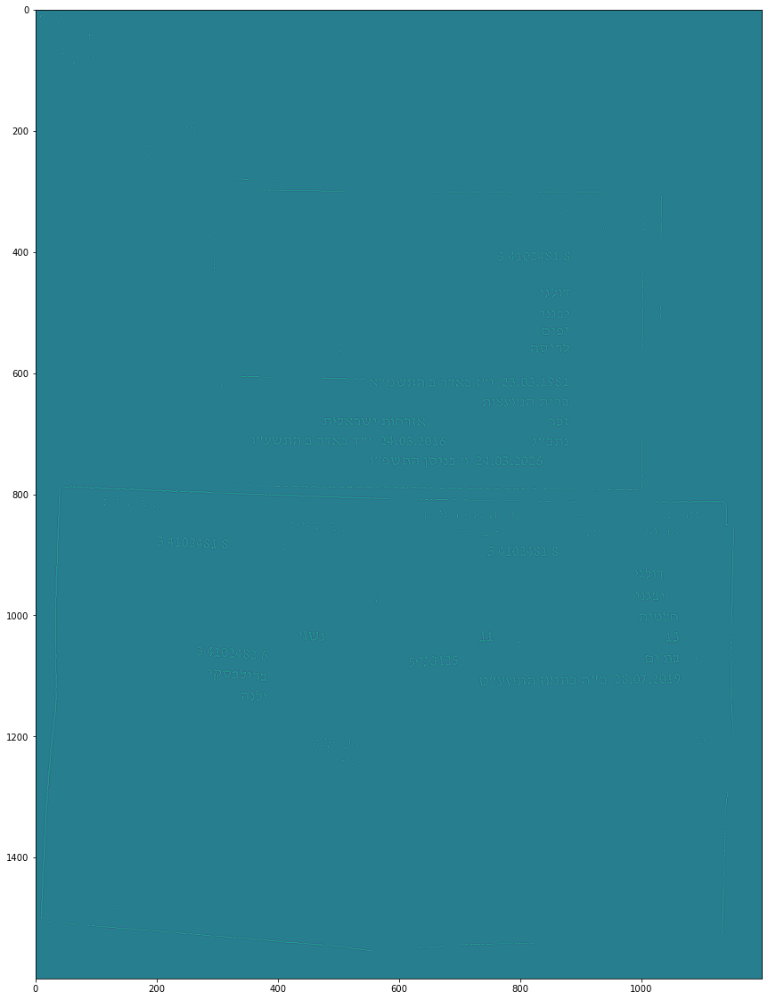

In [240]:
display(laplacian)

In [247]:
blended = cv2.addWeighted(src1=sobelx, alpha=0.5, src2=sobely, beta=0.5, gamma=0)

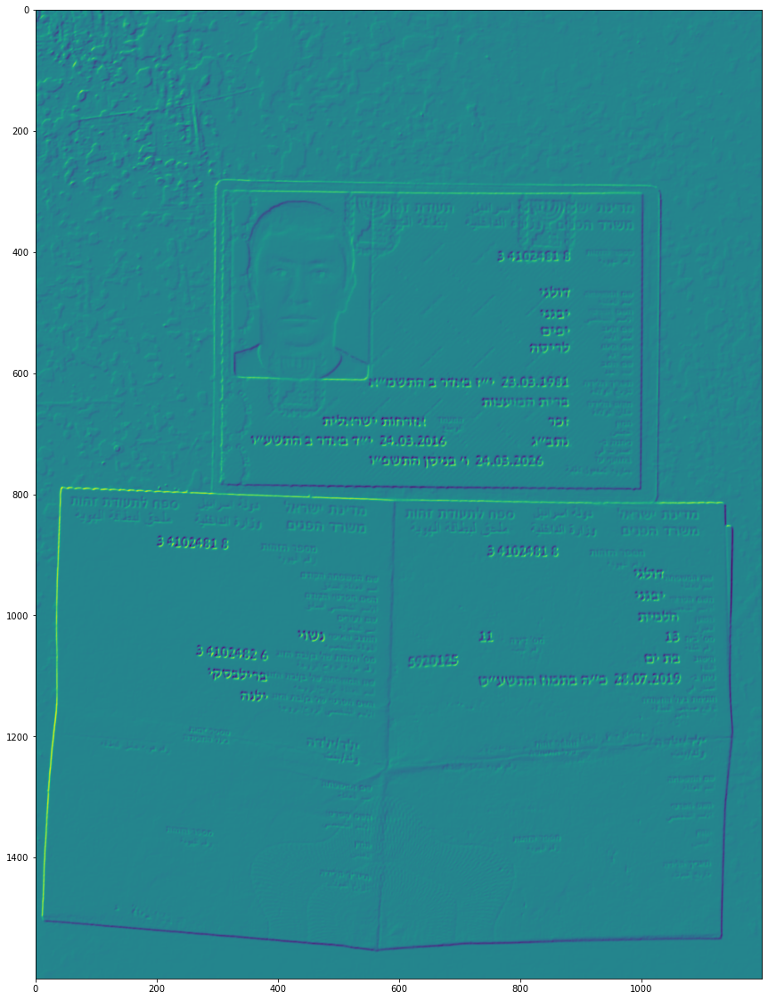

In [248]:
display(blended)

# Histograms

In [252]:
hist = cv2.calcHist([id_blured], channels=[0], mask=None, histSize=[256], ranges=[0,256]) 
#[0] stands for B in BGR. Mask if we want to take hist of some images region

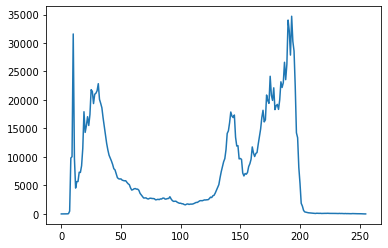

In [254]:
plt.plot(hist)